In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import spacy
import gensim
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
import math
import time
import plotly.express as px
import sys
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())
import os
RS = 123

In [2]:
data = pd.read_csv("../input/bible/t_asv.csv")

## To-do
1. Cluster the bible according to the book
2. Cluster the bible using K-Means (Doc2Vec of verses)
3. Sentiment of each bible chapter
4. Text completion using Transformers package

In [3]:
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(data['t'])]

In [4]:
model = Doc2Vec(documents, vector_size=10, workers=4)

In [5]:
vector = [model.infer_vector([i]) for i in list(data['t'])]
vector = np.array(vector)

### Cluster the Bible according to the book

In [6]:
perplex = math.sqrt(vector.shape[0])
RS = 123
time_start = time.time()
tsne = TSNE(perplexity = perplex, learning_rate = 100, n_iter = 700, random_state=RS).fit_transform(vector)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 548.9560852050781 seconds


In [7]:
columns = list(data.columns)
columns.extend(['comp1', 'comp2'])
data_filter = np.concatenate((data.to_numpy(),tsne), axis = 1)
data_filter = pd.DataFrame(data_filter, columns = columns)
data_filter.head(2)

,id,b,c,v,t,comp1,comp2
0,1001001,1,1,1,In the beginning God created the heavens and t...,-13.9452,6.6659
1,1001002,1,1,2,And the earth was waste and void; and darkness...,-0.20321,-5.55036


In [8]:
fig = px.scatter(data_filter, x="comp1", y="comp2", hover_data=["t"], color="b")
fig.show()

According to this, bible apparently has only one theme

### Cluster the bible using ML algorithms

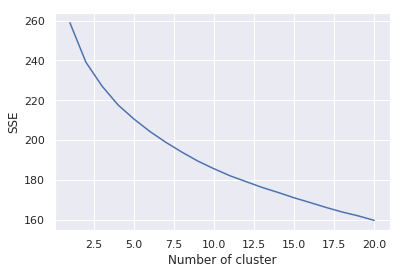

In [9]:
sse = {}
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(vector)
    clusters = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()


Cannot form any significant cluster because no elbow arises. Hence we go for GaussianMixture model

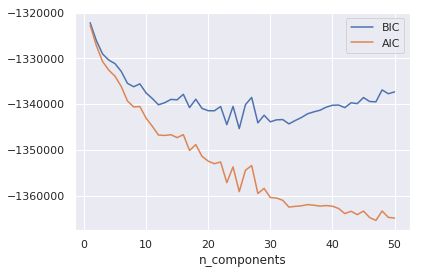

In [10]:
n_components = np.arange(1, 51)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(vector) for n in n_components]
plt.plot(n_components, [m.bic(vector) for m in models], label='BIC')
plt.plot(n_components, [m.aic(vector) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

We see a minima at cluster = 20 and hence we divide the data in 20 clusters

In [11]:
gmm = GaussianMixture(n_components=20)
gmm.fit(vector)
labels = gmm.predict(vector)

In [12]:
perplex = math.sqrt(vector.shape[0])
RS = 123
time_start = time.time()
tsne = TSNE(perplexity = perplex, learning_rate = 100, n_iter = 700, random_state=RS).fit_transform(vector)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 537.9756689071655 seconds


In [13]:
columns = list(data.columns)
columns.extend(['comp1', 'comp2', 'labels'])
data_filter = np.concatenate((data.to_numpy(),tsne, labels.reshape(31103,1)), axis = 1)
data_filter = pd.DataFrame(data_filter, columns = columns)
data_filter.head(2)

,id,b,c,v,t,comp1,comp2,labels
0,1001001,1,1,1,In the beginning God created the heavens and t...,-13.9452,6.6659,11
1,1001002,1,1,2,And the earth was waste and void; and darkness...,-0.20321,-5.55036,13


In [14]:
fig = px.scatter(data_filter, x="comp1", y="comp2", hover_data=["t"], color="labels")
fig.show()

There are small, overlapping clusters of themes in bible